In [1]:

# Importar las librerías necesarias
import torch
import matplotlib.pyplot as plt
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import numpy as np
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Verificar si CUDA está disponible y configurar el dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")


Usando dispositivo: cuda


In [2]:

# Definir las transformaciones a aplicar a las imágenes, incluyendo técnicas de aumentación
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),  # Aumentación: Flip horizontal aleatorio
    transforms.RandomRotation(20),      # Aumentación: Rotación aleatoria
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Variación de brillo y color
    transforms.Resize((128, 128)),      # Redimensionar imágenes a 128x128 píxeles
    transforms.ToTensor(),              # Convertir imágenes a tensores
])

# Ruta al directorio de imágenes
images_dir = '../data/arcgis-survey-images-new'

# Cargar el dataset de entrenamiento usando ImageFolder con aumentación de datos
train_dataset = datasets.ImageFolder(root=images_dir, transform=transform)

# Crear un DataLoader para manejar el batching y el shuffle
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# Obtener los nombres de las clases a partir del dataset
class_names = train_dataset.classes
num_classes = len(class_names)
print(f"Clases encontradas: {class_names}")


Clases encontradas: ['Chinche salivosa', 'Clororis', 'Hoja sana', 'Roya naranja', 'Roya purpura']


In [3]:

# Utilizar una red preentrenada para extraer características (por ejemplo, ResNet18)
model = models.resnet18(pretrained=True)
model = model.to(device)
model.eval()  # Cambiar a modo de evaluación

# Función para extraer características usando ResNet18
def extract_features(loader, model, device):
    features = []
    labels = []
    with torch.no_grad():
        for images, lbls in loader:
            images = images.to(device)
            output = model(images)  # Extraer características de la capa de salida
            features.append(output.cpu())
            labels.extend(lbls.numpy())

    features = torch.cat(features).numpy()
    labels = np.array(labels)
    return features, labels

# Extraer características del dataset utilizando ResNet18
features, labels = extract_features(train_loader, model, device)


C:\Users\ealda\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ealda\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to C:\Users\ealda/.cache\torch\hub\checkpoints\resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:01<0

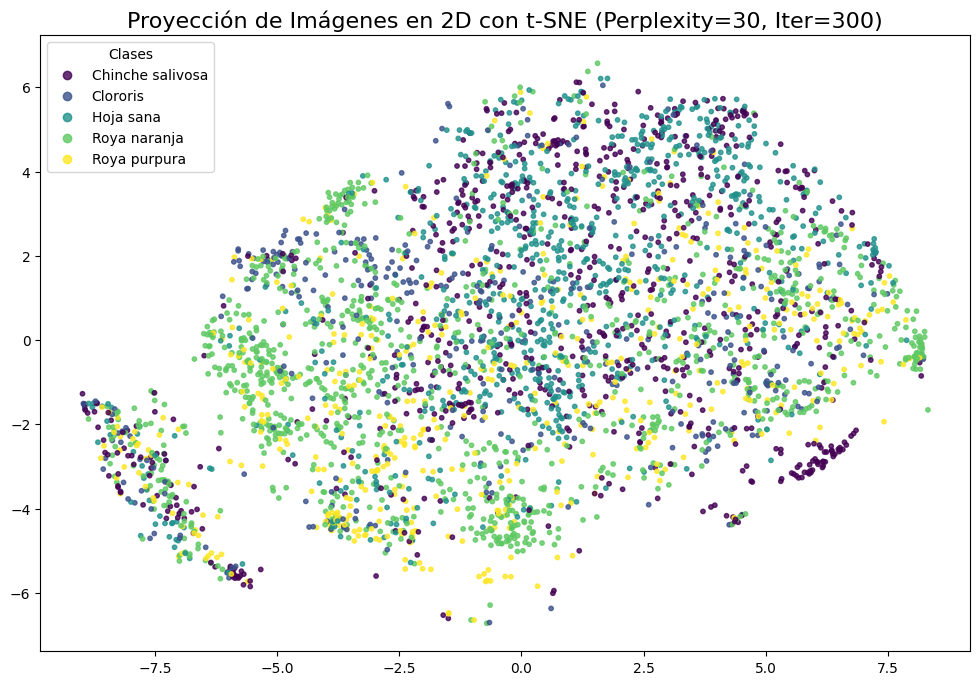

In [4]:

# Función para visualizar la proyección de imágenes en 2D con ajuste de hiperparámetros de t-SNE
def visualize_latent_space(features, labels, perplexity=30, n_iter=300):
    # Usar PCA para reducir la dimensionalidad antes de aplicar t-SNE
    pca = PCA(n_components=50)
    features_pca = pca.fit_transform(features)

    # Aplicar t-SNE
    tsne = TSNE(n_components=2, perplexity=perplexity, n_iter=n_iter)
    features_tsne = tsne.fit_transform(features_pca)

    # Visualizar el resultado
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=labels, cmap='viridis', s=10, alpha=0.8)
    plt.legend(handles=scatter.legend_elements()[0], labels=class_names, title="Clases")
    plt.title(f"Proyección de Imágenes en 2D con t-SNE (Perplexity={perplexity}, Iter={n_iter})", fontsize=16)
    plt.show()

# Visualizar la proyección con los valores de hiperparámetros de t-SNE predeterminados
visualize_latent_space(features, labels, perplexity=30, n_iter=300)


Usando dispositivo: cuda
Clases encontradas: ['Chinche salivosa', 'Clororis', 'Hoja sana', 'Roya naranja', 'Roya purpura']


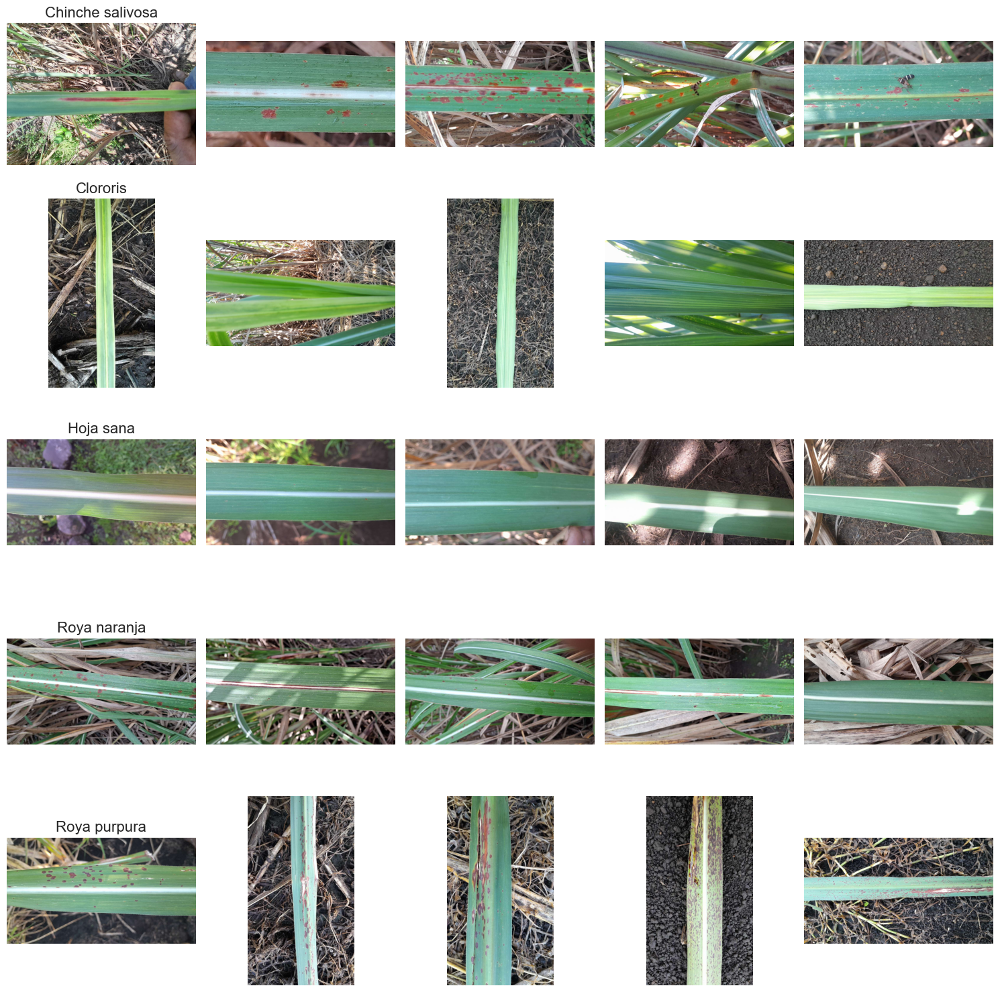

C:\Users\ealda\AppData\Local\Temp\ipykernel_24476\1907086629.py:132: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Clase', y='Número de Imágenes', data=df_counts, palette='viridis')


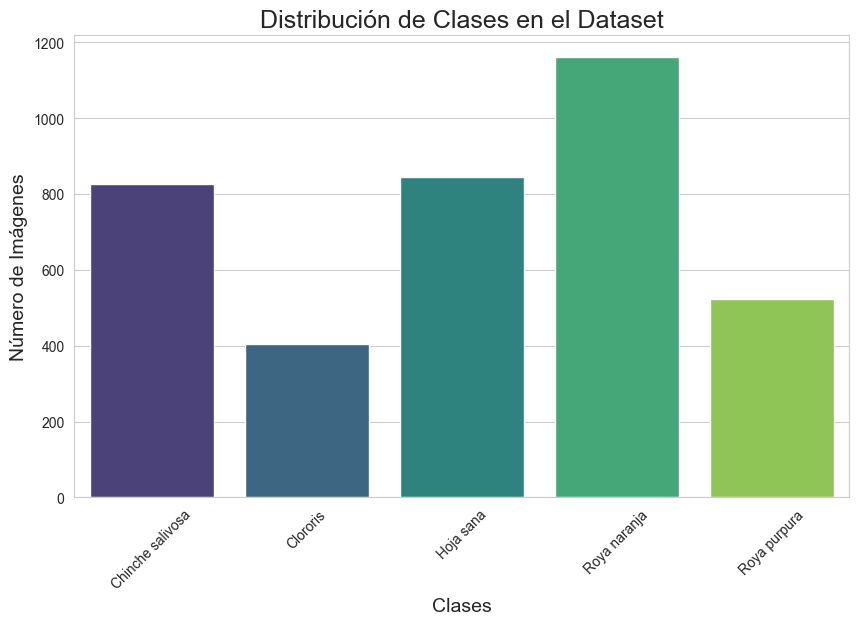

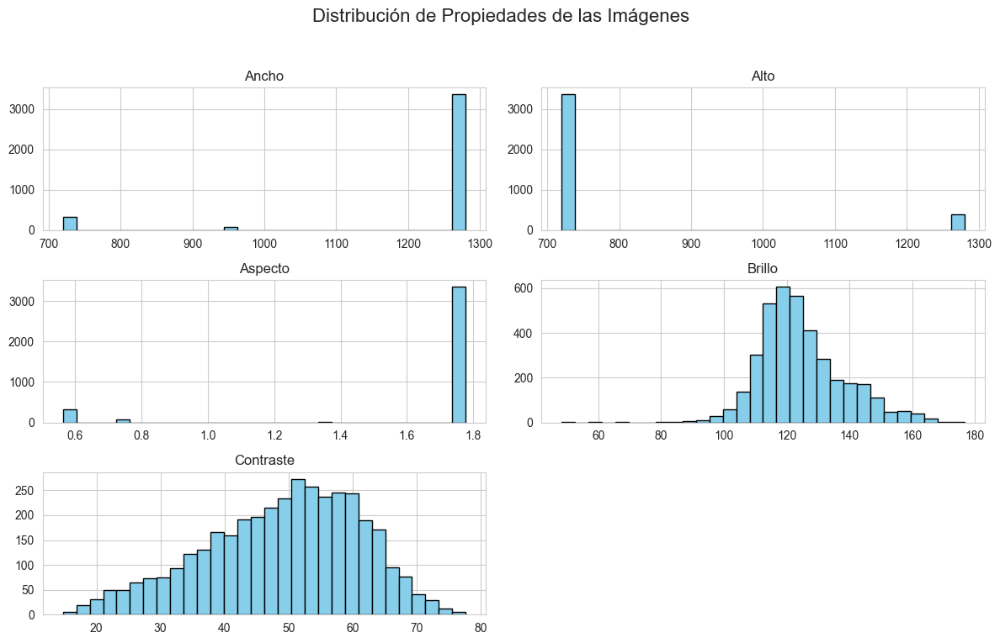

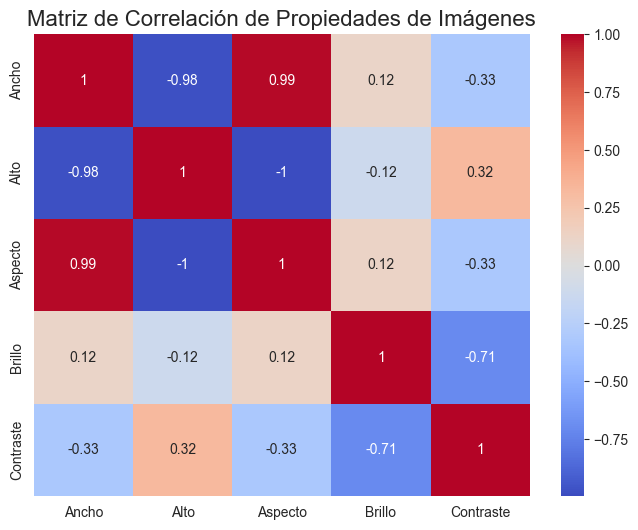


Aplicando filtros a una imagen de la clase: Chinche salivosa


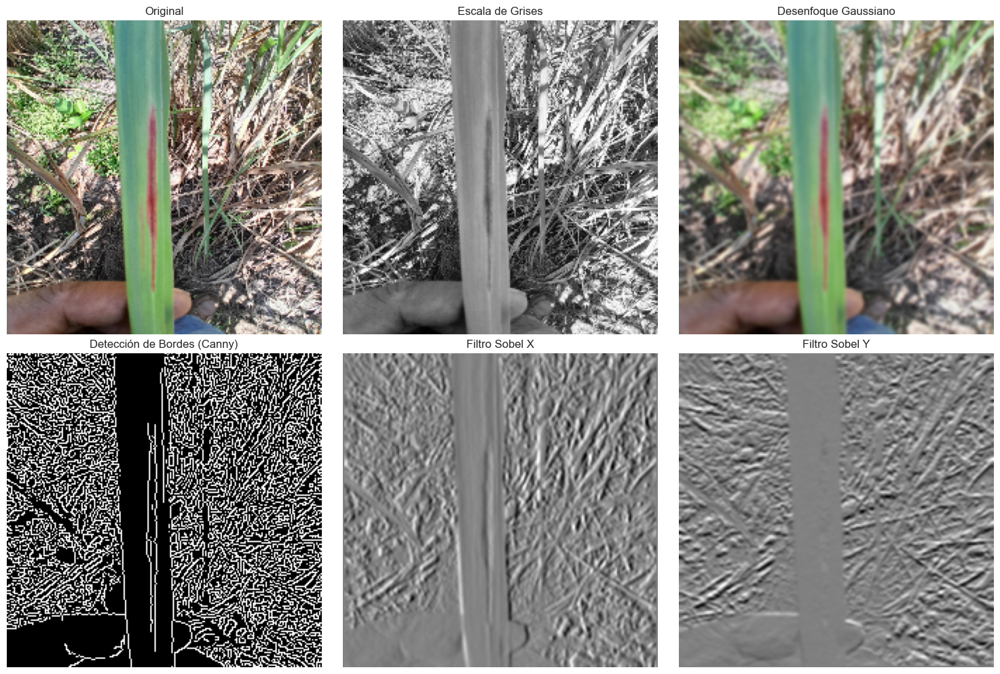


Aplicando filtros a una imagen de la clase: Clororis


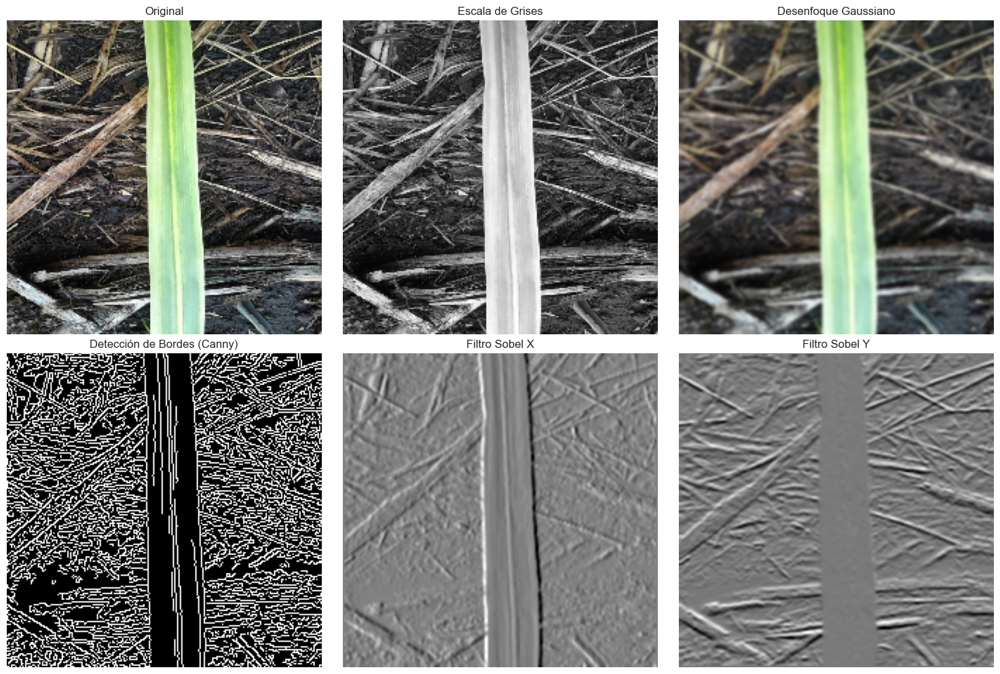


Aplicando filtros a una imagen de la clase: Hoja sana


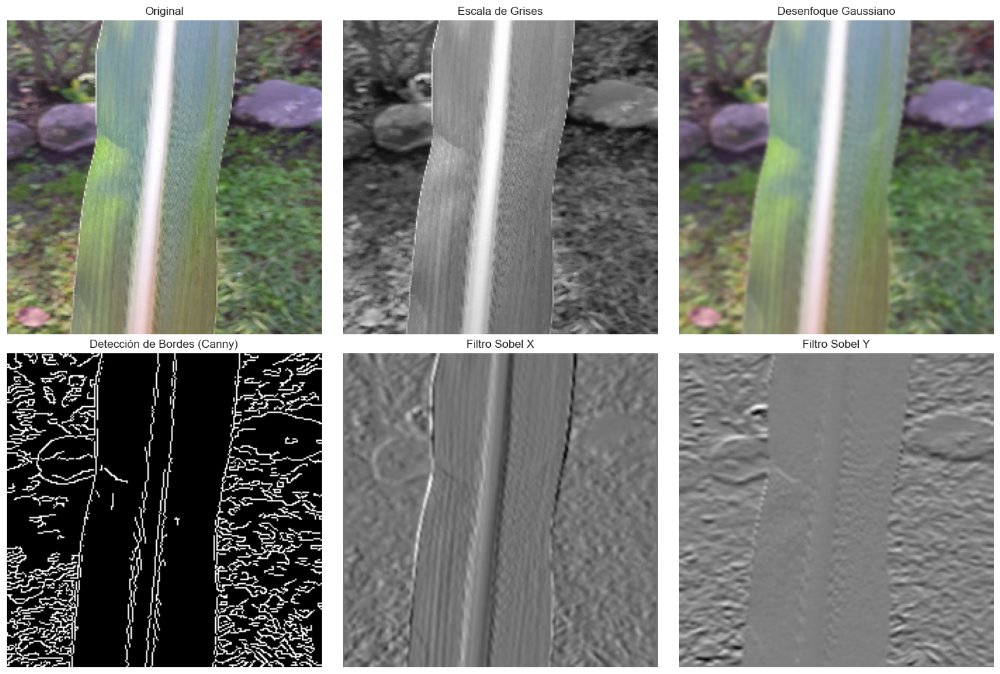


Aplicando filtros a una imagen de la clase: Roya naranja


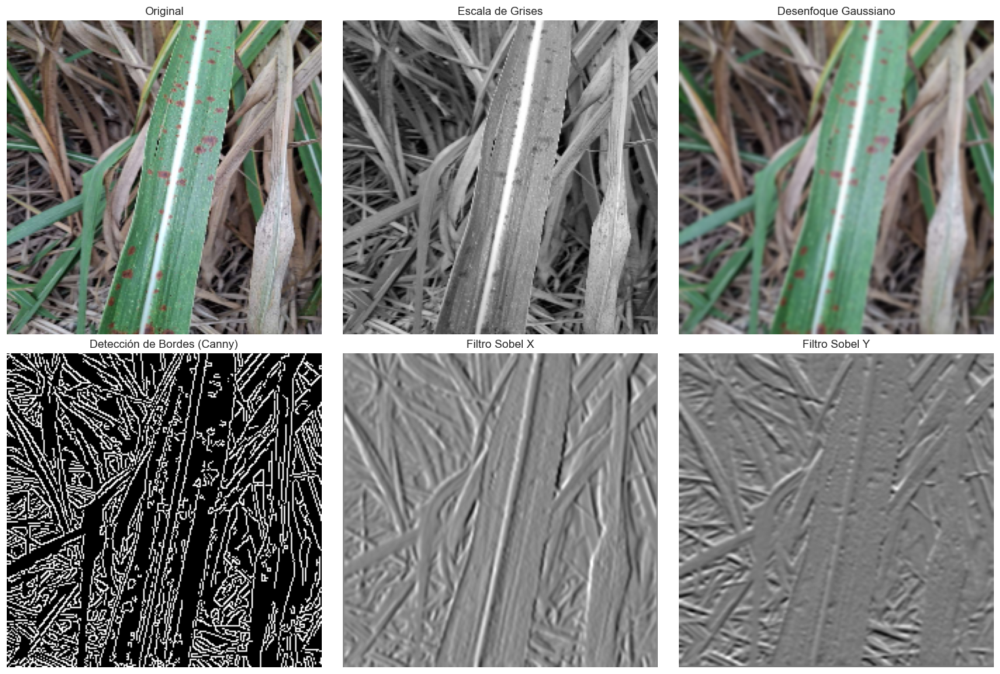


Aplicando filtros a una imagen de la clase: Roya purpura


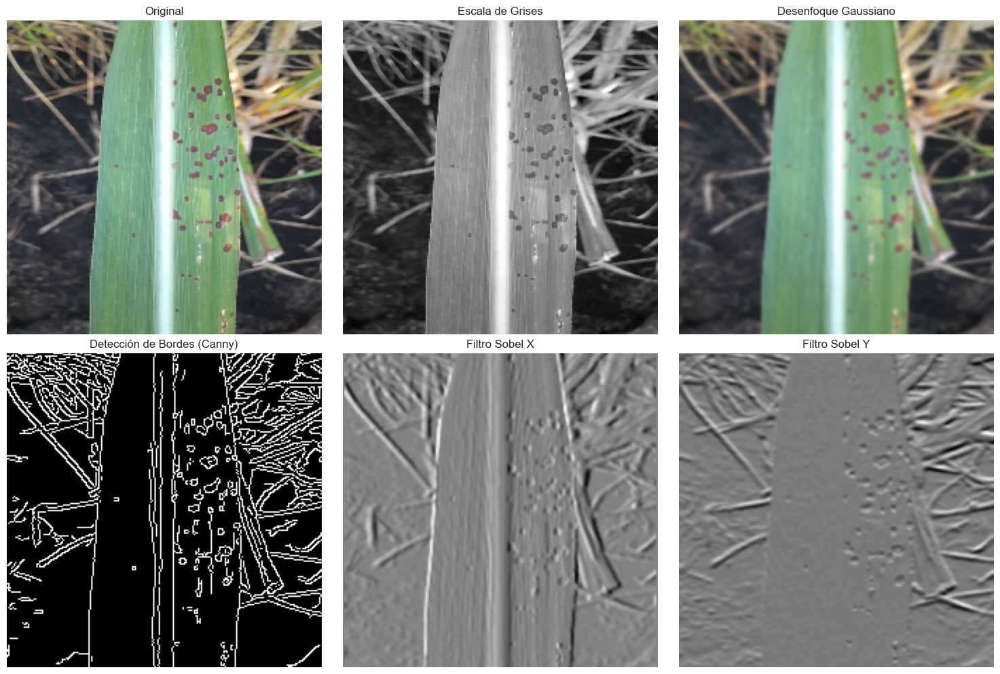


Histograma de color para una imagen de muestra:


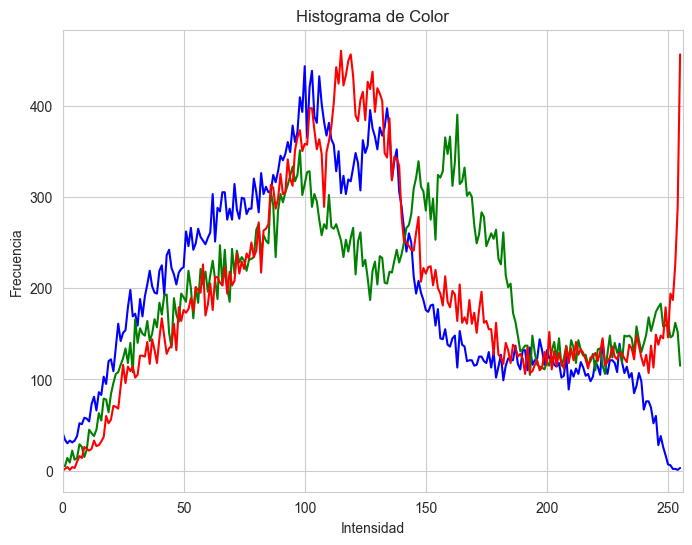

ImportError: cannot import name 'greycomatrix' from 'skimage.feature' (C:\Users\ealda\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\skimage\feature\__init__.py)

In [4]:
import skimage
print(skimage.__version__)


0.24.0
